In [75]:
import pandas as pd
import pickle
import numpy as np
import matplotlib.pyplot as plt
from seysmo.models.model_class import CNN, CNNLSTMNetwork, CNNLSTMNetwork2, ParallelLSTMConv2DModel
from seysmo.models.train_model import train, evaluate
from seysmo.models.utils import save_model, load_model, count_parameters, EarlyStopper, SignalSpeedDataset, give_data
from seysmo.visualization.plotting import plot_map
from seysmo.features.mapping import do_array_for_mapping, compute_y_pred
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchinfo import summary
from torchmetrics import MeanAbsolutePercentageError

import mlflow

mlflow.set_tracking_uri("http://localhost:5000")

In [70]:
def filter_and_trim(data):
    result = {}
    for key, (a, b) in data.items():
        if len(b[0]) == 10:
            if a.shape[0] == 28:
                result[key] = (a, b)
            elif a.shape[0] == 30:
                trimmed_a = a[1:-1, :]  # Удаляем первый и последний временной ряд
                result[key] = (trimmed_a, b)
    return result

In [71]:
with open('../data/processed/second_place.pkl', 'rb') as f:
    data_coord = pickle.load(f)
filtered_data = filter_and_trim(data_coord)
coordinates = list(filtered_data.keys())
sorted_coordinates = sorted(coordinates, key=lambda x: x[1])
sorted_array = np.array(sorted_coordinates)
coord_train = sorted_array[:]
X_train = []
y_train = []
for key in coord_train:
    X_train.append(filtered_data[tuple(key.tolist())][0])
    y_train.append(filtered_data[tuple(key.tolist())][1][0])
# X_train = np.array(X_train)
# y_train = np.array(y_train)

C:\Users\vitya\AppData\Local\Temp\ipykernel_7128\2909302798.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if len(b[0]) == 10:
C:\Users\vitya\AppData\Local\Temp\ipykernel_7128\3865701721.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_train.append(filtered_data[tuple(key.tolist())][1][0])


In [73]:
ch = dict()
for i in range(len(y_train)):
    if np.array(y_train[i]).shape in ch:
        ch[np.array(y_train[i]).shape] += 1
    else:
        ch[np.array(y_train[i]).shape] = 1
ch

{(10,): 17005}

In [74]:
X_train = np.transpose(X_train, (0,2,1))
X_train.shape

(17005, 313, 28)

In [80]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
in_channels = 1
out_channels = 16
conv_kernel_size = 4
pool_kernel_size = 2
stride = 2
padding = 1
input_size = 28
hidden_size = 64
num_layers = 32
dropout = 0.2
linear_input_size = 64
linear_output_size = 10
input_shape = X_train[0].shape
epochs = 250
batch_size = 32
learning_rate = 0.001
patience = 3
min_delta = 30
loss_fn = nn.MSELoss()
metric_fn = MeanAbsolutePercentageError().to(device)
model0 = ParallelLSTMConv2DModel(lstm_input_size=input_size, lstm_hidden_size=hidden_size, lstm_num_layers=num_layers, dropout=dropout, conv_in_channels=in_channels, conv_out_channels=out_channels, conv_kernel_size=conv_kernel_size, stride=stride, padding=padding, pool_kernel_size=pool_kernel_size, fc1_output_size=linear_input_size, fc2_output_size=linear_output_size, input_shape=input_shape).to(device)
early_stopper = EarlyStopper(patience=patience, min_delta=min_delta)
optimizer = torch.optim.Adam(model0.parameters(), lr=learning_rate)

In [81]:
train_dataset = SignalSpeedDataset(np.array(X_train, dtype=np.float32), np.array(y_train, dtype=np.float32))
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

In [82]:
mlflow.set_experiment("/Parallel_v0.1")

2024/08/11 19:04:29 INFO mlflow.tracking.fluent: Experiment with name '/Parallel_v0.1' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/677928351121416051', creation_time=1723392269459, experiment_id='677928351121416051', last_update_time=1723392269459, lifecycle_stage='active', name='/Parallel_v0.1', tags={}>

In [83]:
with mlflow.start_run(run_name='second_place') as run:
    params = {
        "epochs": epochs,
        "learning_rate": learning_rate,
        "batch_size": batch_size,
        "loss_function": loss_fn.__class__.__name__,
        "metric_function": metric_fn.__class__.__name__,
        "optimizer": "ADAM",
        "in_channels": in_channels,
        'out_channels': out_channels,
        "conv_kernel_size": conv_kernel_size,
        "pool_kernel_size": pool_kernel_size,
        'stride': stride,
        'padding': padding,
        'input_size': input_size,
        'hidden_size': hidden_size,
        'num_layers': num_layers,
        'dropout': dropout,
        'linear_input_size': linear_input_size,
        'linear_output_size': linear_output_size,
        "input_shape": input_shape,
        'patience': patience,
        'min_delta': min_delta
    }
    # Log training parameters.
    mlflow.log_params(params)

    # Log model summary.
    with open("../models/model_P_summary.txt", "w", encoding="utf-8") as f:
        f.write(str(summary(model0)))
    mlflow.log_artifact("../models/model_P_summary.txt")

    for t in range(epochs):
        print(f"Epoch {t + 1}\n-------------------------------")
        train(train_dataloader, model0, loss_fn, metric_fn, optimizer, epoch=t, device=device,
              output_size=linear_output_size)
        validation_loss, validation_mape = evaluate(train_dataloader, model0, loss_fn, metric_fn, epoch=t, device=device,
                                                    output_size=linear_output_size)

    # Save the trained model to MLflow.
    mlflow.pytorch.log_model(model0, "model")

Epoch 1
-------------------------------
loss: 174747.656250 MAPE: 0.999936 [0 / 532]
loss: 18992.041016 MAPE: 0.243888 [100 / 532]
loss: 4563.820312 MAPE: 0.139206 [200 / 532]
loss: 4993.872559 MAPE: 0.133598 [300 / 532]
loss: 6543.648438 MAPE: 0.136064 [400 / 532]
loss: 5253.065918 MAPE: 0.141977 [500 / 532]
Eval metrics: 
MAPE: 0.13, Avg loss: 5030.623224 

Epoch 2
-------------------------------
loss: 3940.750732 MAPE: 0.121195 [0 / 532]
loss: 4555.724121 MAPE: 0.123133 [100 / 532]
loss: 3858.991455 MAPE: 0.118323 [200 / 532]
loss: 4351.245605 MAPE: 0.127309 [300 / 532]
loss: 3967.951904 MAPE: 0.126388 [400 / 532]
loss: 3744.303955 MAPE: 0.117366 [500 / 532]
Eval metrics: 
MAPE: 0.12, Avg loss: 4411.040205 

Epoch 3
-------------------------------
loss: 3644.795654 MAPE: 0.108985 [0 / 532]
loss: 3381.179688 MAPE: 0.113922 [100 / 532]
loss: 6333.575684 MAPE: 0.137150 [200 / 532]
loss: 3832.668701 MAPE: 0.116418 [300 / 532]
loss: 3018.570068 MAPE: 0.096821 [400 / 532]
loss: 4575.68603

KeyboardInterrupt: 

In [84]:
validation_loss, validation_mape = evaluate(train_dataloader, model0, loss_fn, metric_fn, epoch=t, device=device,
                                                    output_size=linear_output_size)

Eval metrics: 
MAPE: 0.09, Avg loss: 2689.456970 


In [85]:
from math import floor
import segyio

In [97]:
seysm_dict = dict()
with segyio.open('../data/raw/second_place/Area2_all_processed_data.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/Area2_all_processed_data.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

28 / 630610
56 / 630610
84 / 630610
112 / 630610
140 / 630610
168 / 630610
196 / 630610
224 / 630610
252 / 630610
280 / 630610
308 / 630610
336 / 630610
364 / 630610
392 / 630610
420 / 630610
448 / 630610
476 / 630610
504 / 630610
532 / 630610
560 / 630610
588 / 630610
616 / 630610
644 / 630610
672 / 630610
700 / 630610
728 / 630610
756 / 630610
784 / 630610
812 / 630610
840 / 630610
868 / 630610
896 / 630610
924 / 630610
952 / 630610
980 / 630610
1008 / 630610
1036 / 630610
1064 / 630610
1092 / 630610
1120 / 630610
1148 / 630610
1176 / 630610
1204 / 630610
1232 / 630610
1260 / 630610
1288 / 630610
1316 / 630610
1344 / 630610
1372 / 630610
1400 / 630610
1428 / 630610
1456 / 630610
1484 / 630610
1512 / 630610
1540 / 630610
1568 / 630610
1596 / 630610
1624 / 630610
1652 / 630610
1680 / 630610
1708 / 630610
1736 / 630610
1764 / 630610
1792 / 630610
1820 / 630610
1848 / 630610
1876 / 630610
1904 / 630610
1932 / 630610
1960 / 630610
1988 / 630610
2016 / 630610
2044 / 630610
2072 / 630610
21

In [98]:
with segyio.open('../data/raw/second_place/Area3_all_processed_data-1.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/Area3_all_processed_data-1.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

30 / 1981598
60 / 1981598
90 / 1981598
120 / 1981598
150 / 1981598
180 / 1981598
210 / 1981598
240 / 1981598
270 / 1981598
300 / 1981598
330 / 1981598
360 / 1981598
390 / 1981598
420 / 1981598
450 / 1981598
480 / 1981598
510 / 1981598
540 / 1981598
570 / 1981598
600 / 1981598
630 / 1981598
660 / 1981598
690 / 1981598
720 / 1981598
750 / 1981598
780 / 1981598
810 / 1981598
840 / 1981598
870 / 1981598
900 / 1981598
930 / 1981598
960 / 1981598
990 / 1981598
1020 / 1981598
1050 / 1981598
1080 / 1981598
1110 / 1981598
1140 / 1981598
1170 / 1981598
1200 / 1981598
1230 / 1981598
1260 / 1981598
1290 / 1981598
1320 / 1981598
1350 / 1981598
1380 / 1981598
1410 / 1981598
1440 / 1981598
1470 / 1981598
1500 / 1981598
1530 / 1981598
1560 / 1981598
1590 / 1981598
1620 / 1981598
1650 / 1981598
1680 / 1981598
1710 / 1981598
1740 / 1981598
1770 / 1981598
1800 / 1981598
1830 / 1981598
1860 / 1981598
1890 / 1981598
1920 / 1981598
1950 / 1981598
1980 / 1981598
2010 / 1981598
2040 / 1981598
2070 / 1981598
2

In [99]:
with segyio.open('../data/raw/second_place/0-1200.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/0-1200.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

448 / 442954
980 / 442954
1708 / 442954
2465 / 442954
3277 / 442954
4091 / 442954
4959 / 442954
5828 / 442954
6696 / 442954
7564 / 442954
8431 / 442954
9302 / 442954
10170 / 442954
11069 / 442954
11965 / 442954
12864 / 442954
13760 / 442954
14658 / 442954
15553 / 442954
16424 / 442954
17319 / 442954
18219 / 442954
19114 / 442954
20015 / 442954
20910 / 442954
21810 / 442954
22705 / 442954
23605 / 442954
24500 / 442954
25401 / 442954
26296 / 442954
27197 / 442954
28092 / 442954
28993 / 442954
29860 / 442954
30757 / 442954
31652 / 442954
32550 / 442954
33446 / 442954
34344 / 442954
35240 / 442954
36138 / 442954
37034 / 442954
37932 / 442954
38828 / 442954
39725 / 442954
40621 / 442954
41519 / 442954
42415 / 442954
43313 / 442954
44209 / 442954
45107 / 442954
46003 / 442954
46901 / 442954
47797 / 442954
48695 / 442954
49591 / 442954
50489 / 442954
51384 / 442954
52283 / 442954
53179 / 442954
54080 / 442954
54976 / 442954
55875 / 442954
56771 / 442954
57670 / 442954
58566 / 442954
59466 / 4

In [100]:
with segyio.open('../data/raw/second_place/1201-1500.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/1201-1500.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

1845 / 573647
3701 / 573647
5547 / 573647
7403 / 573647
9249 / 573647
11107 / 573647
12923 / 573647
14779 / 573647
16623 / 573647
18479 / 573647
20297 / 573647
22154 / 573647
23999 / 573647
25855 / 573647
27673 / 573647
29529 / 573647
31376 / 573647
33230 / 573647
35076 / 573647
36930 / 573647
38750 / 573647
40603 / 573647
42451 / 573647
44307 / 573647
46153 / 573647
48010 / 573647
49856 / 573647
51715 / 573647
53534 / 573647
55364 / 573647
57209 / 573647
59068 / 573647
60914 / 573647
62773 / 573647
64617 / 573647
66475 / 573647
68318 / 573647
70176 / 573647
71995 / 573647
73853 / 573647
75699 / 573647
77557 / 573647
79404 / 573647
81262 / 573647
83109 / 573647
84967 / 573647
86813 / 573647
88669 / 573647
90515 / 573647
92370 / 573647
94216 / 573647
96044 / 573647
97862 / 573647
99717 / 573647
101563 / 573647
103417 / 573647
105263 / 573647
107146 / 573647
109020 / 573647
110904 / 573647
112750 / 573647
114634 / 573647
116508 / 573647
118389 / 573647
120263 / 573647
122146 / 573647
124

In [101]:
with segyio.open('../data/raw/second_place/1501-1800.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/1501-1800.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

1954 / 573788
3924 / 573788
5878 / 573788
7848 / 573788
9803 / 573788
11773 / 573788
13728 / 573788
15698 / 573788
17653 / 573788
19621 / 573788
21577 / 573788
23547 / 573788
25502 / 573788
27471 / 573788
29427 / 573788
31397 / 573788
33325 / 573788
35292 / 573788
37249 / 573788
39220 / 573788
41176 / 573788
43144 / 573788
45100 / 573788
47069 / 573788
49025 / 573788
50991 / 573788
52947 / 573788
54914 / 573788
56870 / 573788
58836 / 573788
60793 / 573788
62760 / 573788
64690 / 573788
66657 / 573788
68615 / 573788
70582 / 573788
72540 / 573788
74479 / 573788
76436 / 573788
78403 / 573788
80360 / 573788
82328 / 573788
84285 / 573788
86252 / 573788
88208 / 573788
90175 / 573788
92131 / 573788
94101 / 573788
96057 / 573788
98024 / 573788
99981 / 573788
101948 / 573788
103876 / 573788
105815 / 573788
107770 / 573788
109737 / 573788
111694 / 573788
113661 / 573788
115617 / 573788
117582 / 573788
119538 / 573788
121504 / 573788
123460 / 573788
125424 / 573788
127382 / 573788
129349 / 573788


In [102]:
with segyio.open('../data/raw/second_place/1801-2100.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/1801-2100.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

1872 / 563956
3749 / 563956
5622 / 563956
7500 / 563956
9373 / 563956
11252 / 563956
13125 / 563956
15005 / 563956
16878 / 563956
18759 / 563956
20632 / 563956
22514 / 563956
24387 / 563956
26265 / 563956
28110 / 563956
29991 / 563956
31864 / 563956
33715 / 563956
35588 / 563956
37467 / 563956
39340 / 563956
41191 / 563956
43064 / 563956
44945 / 563956
46818 / 563956
48697 / 563956
50570 / 563956
52449 / 563956
54322 / 563956
56201 / 563956
58074 / 563956
59953 / 563956
61798 / 563956
63677 / 563956
65520 / 563956
67399 / 563956
69269 / 563956
71149 / 563956
73020 / 563956
74899 / 563956
76769 / 563956
78649 / 563956
80519 / 563956
82398 / 563956
84268 / 563956
86121 / 563956
87991 / 563956
89871 / 563956
91740 / 563956
93622 / 563956
95492 / 563956
97375 / 563956
99245 / 563956
101098 / 563956
102969 / 563956
104849 / 563956
106720 / 563956
108600 / 563956
110471 / 563956
112351 / 563956
114222 / 563956
116103 / 563956
117947 / 563956
119827 / 563956
121699 / 563956
123578 / 563956
12

In [103]:
with segyio.open('../data/raw/second_place/2101-2500.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/2101-2500.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

1844 / 312436
3721 / 312436
5593 / 312436
7469 / 312436
9340 / 312436
11218 / 312436
13090 / 312436
14970 / 312436
16843 / 312436
18724 / 312436
20597 / 312436
22477 / 312436
24349 / 312436
26231 / 312436
28103 / 312436
29982 / 312436
31856 / 312436
33735 / 312436
35608 / 312436
37489 / 312436
39360 / 312436
41240 / 312436
43110 / 312436
44991 / 312436
46861 / 312436
48742 / 312436
50613 / 312436
52494 / 312436
54367 / 312436
56248 / 312436
58120 / 312436
59971 / 312436
61842 / 312436
63720 / 312436
65592 / 312436
67470 / 312436
69315 / 312436
71166 / 312436
73011 / 312436
74890 / 312436
76735 / 312436
78586 / 312436
80458 / 312436
82338 / 312436
84209 / 312436
86086 / 312436
87929 / 312436
89782 / 312436
91652 / 312436
93532 / 312436
95403 / 312436
97227 / 312436
99070 / 312436
100951 / 312436
102820 / 312436
104701 / 312436
106571 / 312436
108452 / 312436
110294 / 312436
112145 / 312436
114016 / 312436
115894 / 312436
117764 / 312436
119642 / 312436
121511 / 312436
123389 / 312436
12

C:\Users\vitya\Work\seysmo\seysmo\visualization\plotting.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


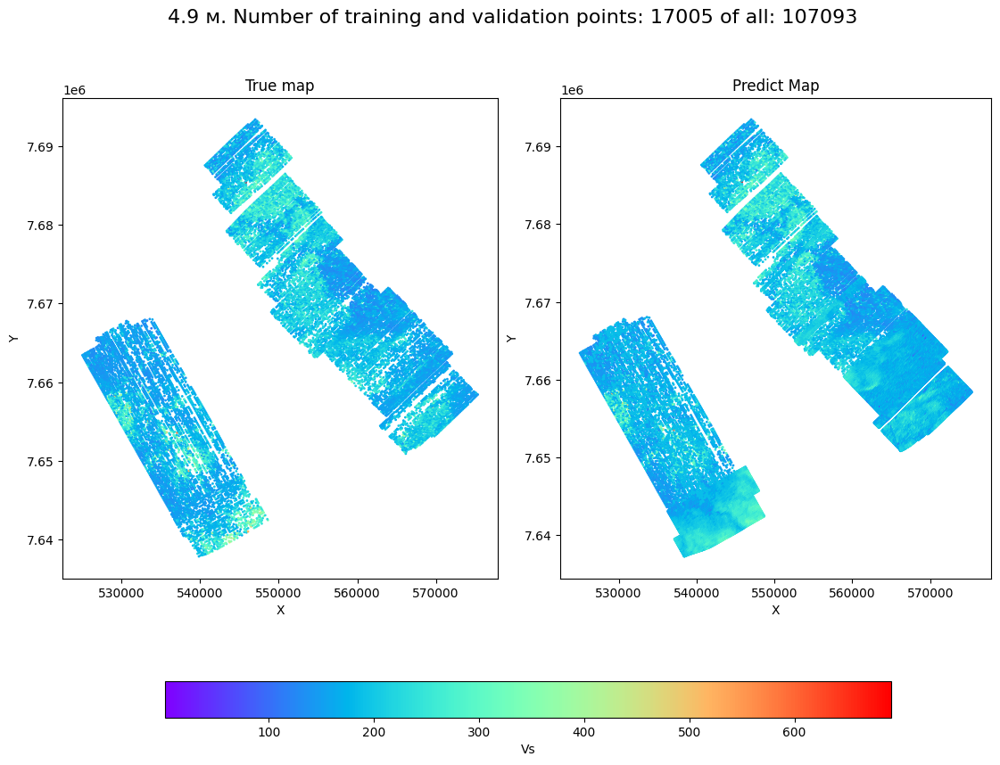

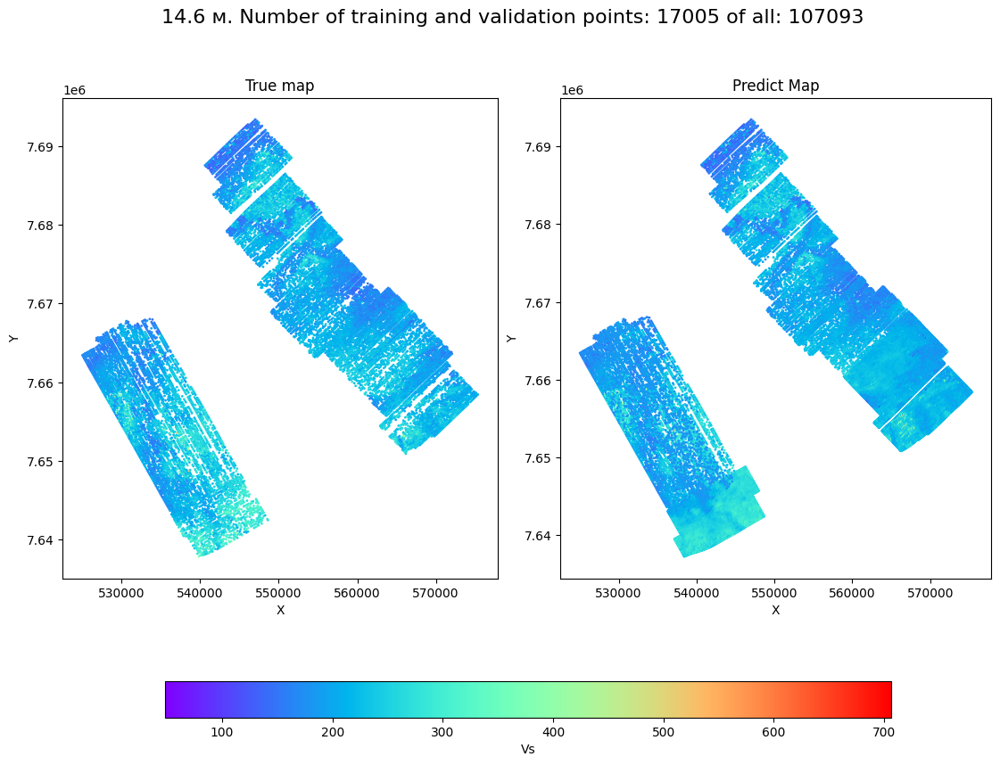

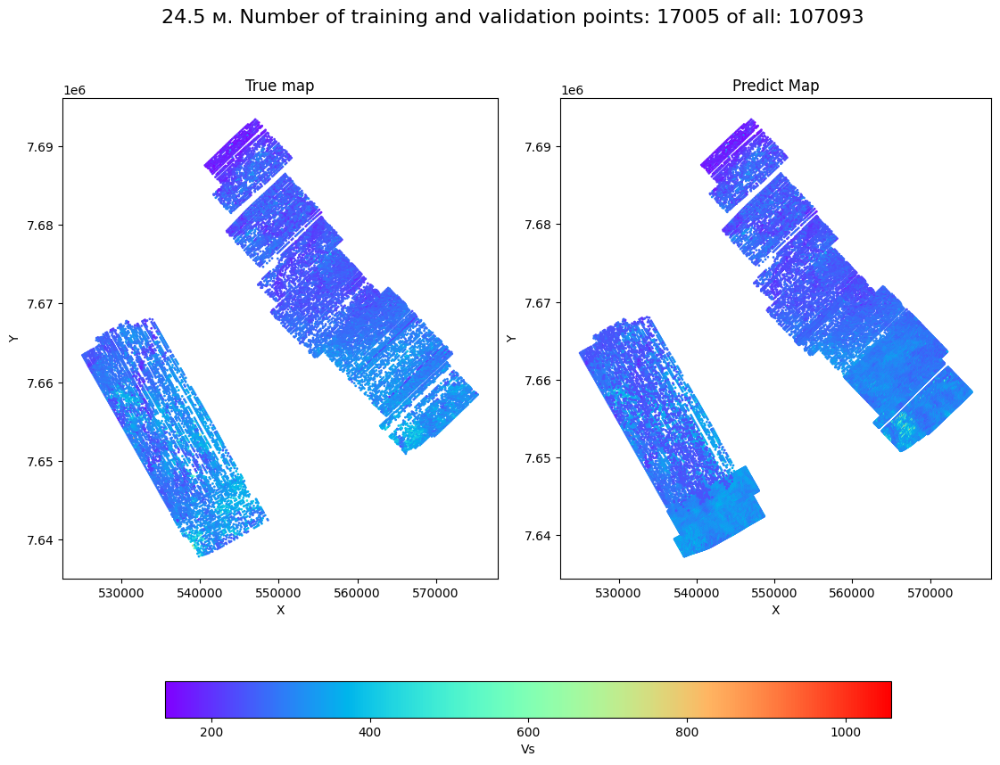

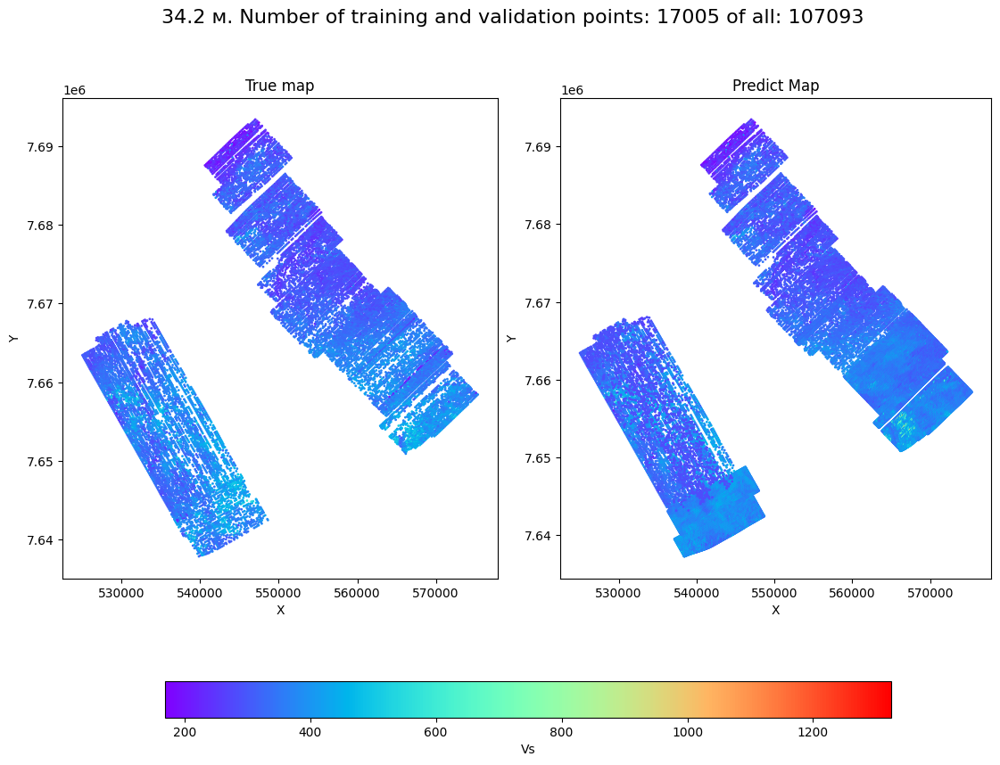

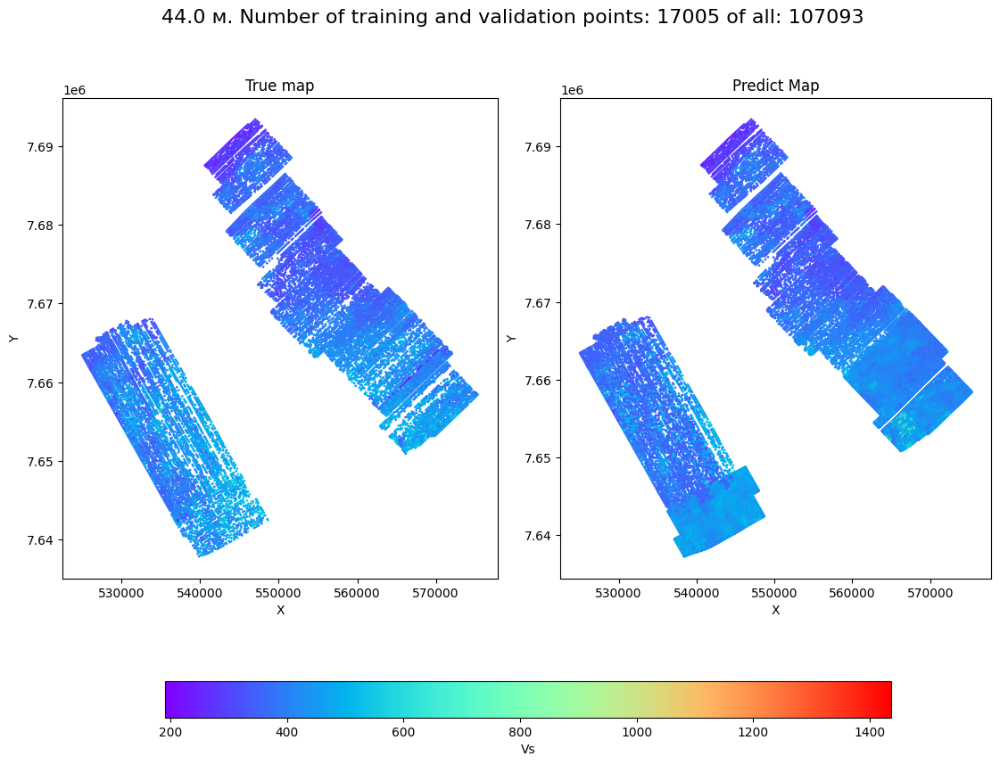

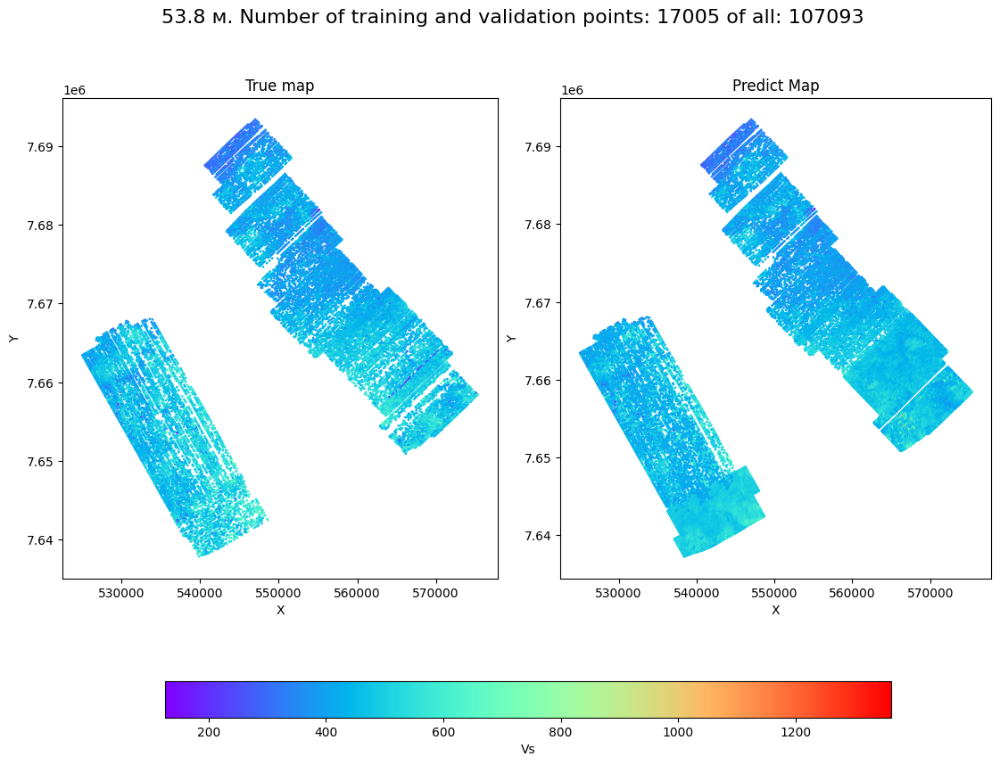

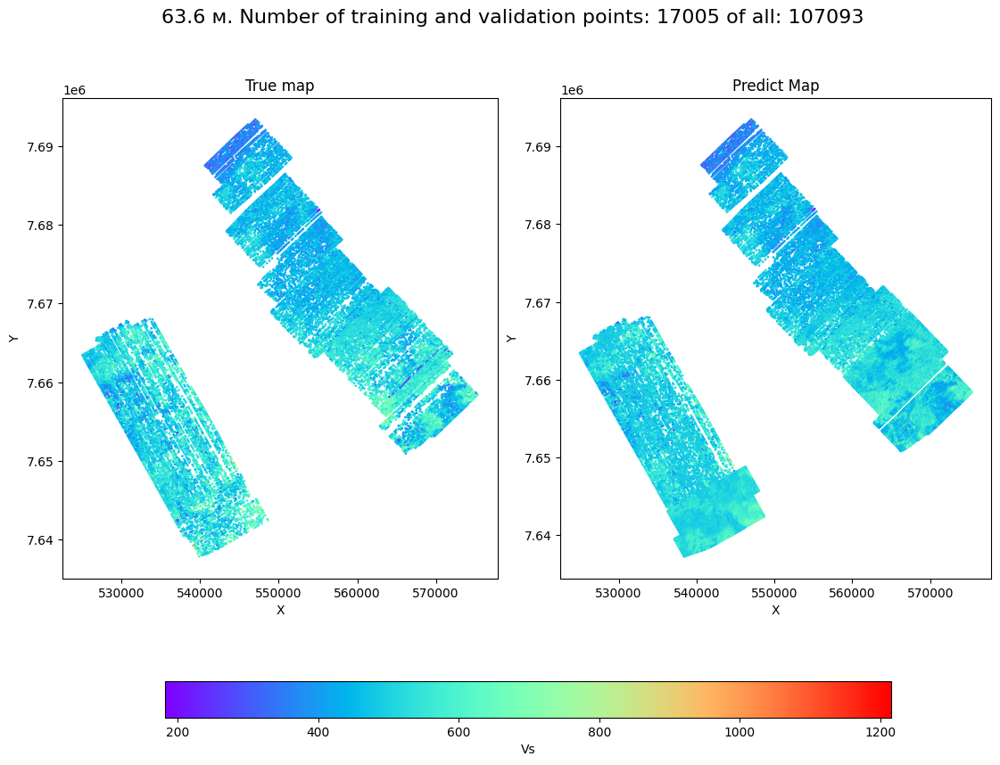

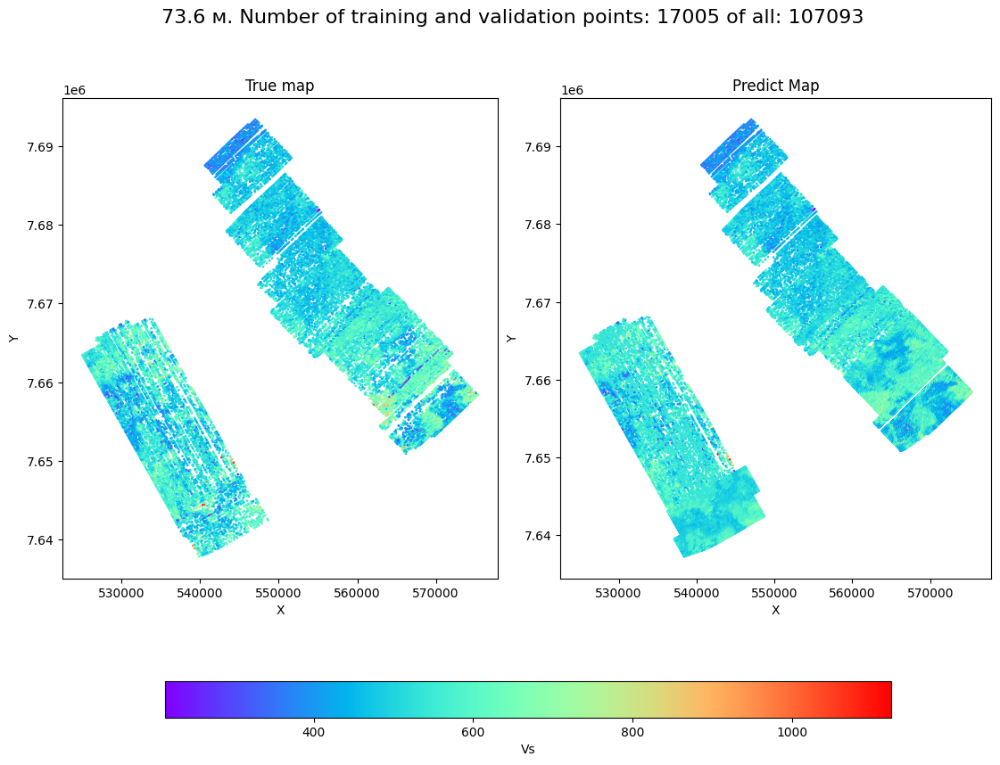

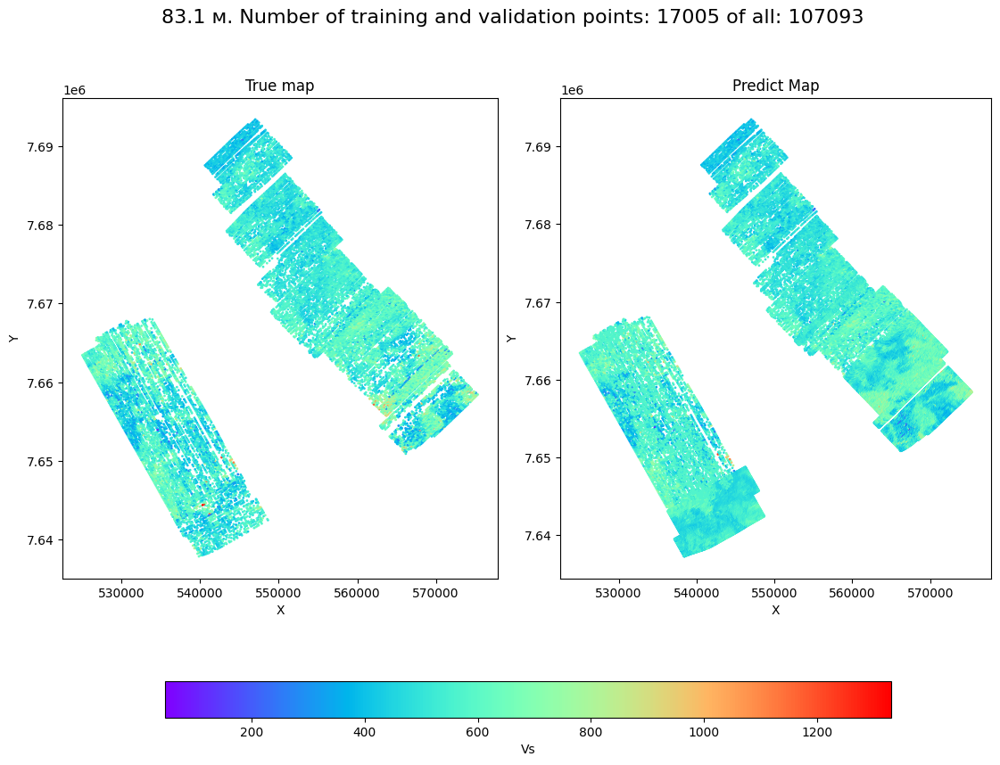

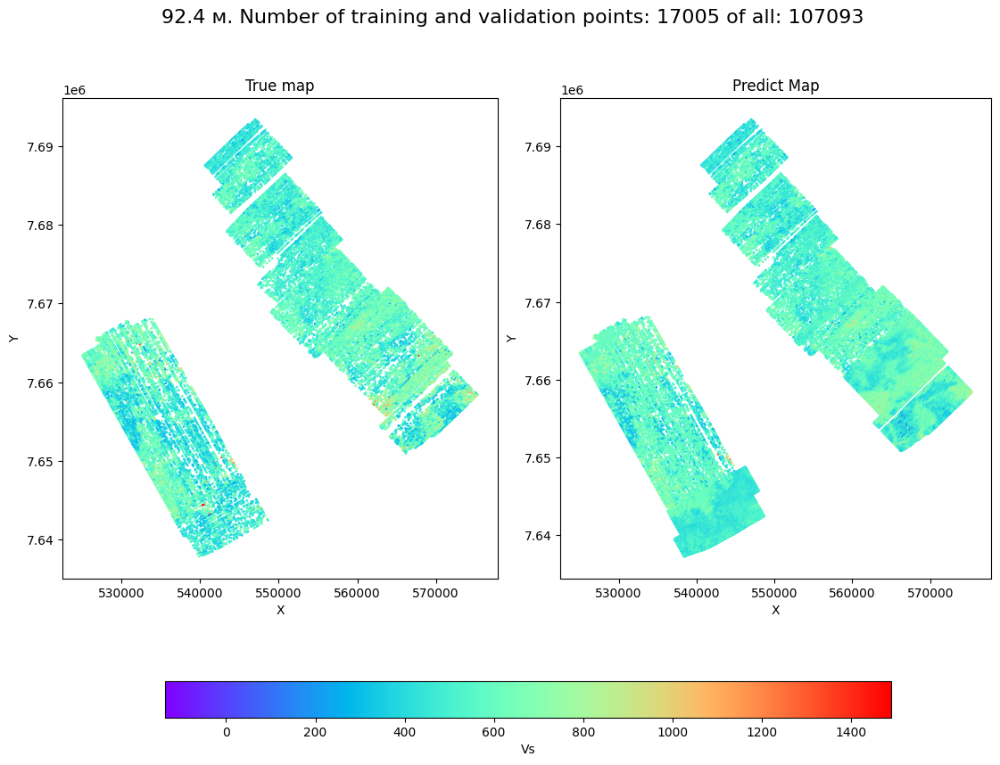

In [117]:
depth_ar = [4.9, 14.6, 24.5, 34.2, 44.0, 53.8, 63.6, 73.6, 83.1, 92.4]
y_pred = np.squeeze(np.array(list(seysm_dict.values())), axis=1)
coord_test = np.array(list(seysm_dict.keys()))
y_train = np.array(y_train)
for i in range(10):
    true_slice = np.column_stack((coord_train, y_train[:, i]))
    pred_slice = do_array_for_mapping(coord_train, coord_test, y_train[:, i], y_pred[:, i])
    our_map = plot_map(true_slice, pred_slice, depth_ar[i], X_train.shape[0], 0, y_pred.shape[0])
    our_map.savefig(f"../reports/figures/maps/{round(depth_ar[i])}map_second_place.png")
    plt.show(our_map)

In [118]:
with segyio.open('../data/raw/second_place/0-1100.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/0-1100.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

1354 / 514178
2913 / 514178
4504 / 514178
6181 / 514178
7834 / 514178
9512 / 514178
11163 / 514178
12841 / 514178
14492 / 514178
16141 / 514178
17764 / 514178
19412 / 514178
21066 / 514178
22743 / 514178
24396 / 514178
26072 / 514178
27723 / 514178
29371 / 514178
30992 / 514178
32639 / 514178
34289 / 514178
35966 / 514178
37616 / 514178
39294 / 514178
40942 / 514178
42620 / 514178
44268 / 514178
45944 / 514178
47624 / 514178
49329 / 514178
51006 / 514178
52711 / 514178
54389 / 514178
56095 / 514178
57774 / 514178
59481 / 514178
61159 / 514178
62865 / 514178
64544 / 514178
66250 / 514178
67928 / 514178
69634 / 514178
71313 / 514178
73017 / 514178
74696 / 514178
76400 / 514178
78080 / 514178
79786 / 514178
81466 / 514178
83171 / 514178
84853 / 514178
86559 / 514178
88243 / 514178
89949 / 514178
91632 / 514178
93340 / 514178
95021 / 514178
96729 / 514178
98410 / 514178
100116 / 514178
101798 / 514178
103502 / 514178
105184 / 514178
106888 / 514178
108569 / 514178
110274 / 514178
111956 / 

In [119]:
with segyio.open('../data/raw/second_place/1101-1400.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/1101-1400.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

3548 / 1126199
7140 / 1126199
10686 / 1126199
14279 / 1126199
17823 / 1126199
21413 / 1126199
24954 / 1126199
28543 / 1126199
32087 / 1126199
35735 / 1126199
39335 / 1126199
43015 / 1126199
46644 / 1126199
50322 / 1126199
53953 / 1126199
57638 / 1126199
61267 / 1126199
64954 / 1126199
68554 / 1126199
72212 / 1126199
75812 / 1126199
79468 / 1126199
83070 / 1126199
86725 / 1126199
90327 / 1126199
93983 / 1126199
97584 / 1126199
101241 / 1126199
104846 / 1126199
108503 / 1126199
112108 / 1126199
115765 / 1126199
119369 / 1126199
123025 / 1126199
126627 / 1126199
130281 / 1126199
133882 / 1126199
137537 / 1126199
141140 / 1126199
144794 / 1126199
148398 / 1126199
152051 / 1126199
155653 / 1126199
159304 / 1126199
162902 / 1126199
166552 / 1126199
170153 / 1126199
173806 / 1126199
177406 / 1126199
181061 / 1126199
184662 / 1126199
188317 / 1126199
191920 / 1126199
195573 / 1126199
199178 / 1126199
202832 / 1126199
206437 / 1126199
210090 / 1126199
213693 / 1126199
217345 / 1126199
220948 / 

In [120]:
with segyio.open('../data/raw/second_place/1401-1700.sgy', "r", endian='big', ignore_geometry=True) as segyfile:
    max_samples = 10
    spec = segyio.spec()
    spec.ilines = np.arange(1, len(segyfile.trace)//28)
    spec.xlines = np.arange(1)
    spec.samples = np.arange(max_samples)
    spec.format = 1
    with segyio.create('../data/external/1401-1700.sgy', spec) as f:
        f.bin.update({
        segyio.BinField.Interval: 100,
        segyio.BinField.Samples: max_samples,
        segyio.BinField.Format: 1,
    }) 
        trace_idx = 0
        tr_start = 0
        tr_last = 1

        while tr_last != len(segyfile.trace) + 1:
            while segyfile.header[tr_last][segyio.TraceField.FieldRecord] == segyfile.header[tr_start][
                segyio.TraceField.FieldRecord]:
                tr_last += 1
                if tr_last == len(segyfile.trace):
                    break
            seysmogramm = pd.DataFrame(segyfile.trace[tr_start:tr_last]).values
            rec_mid_x = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupX] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupX] / 10) / 2))
            rec_mid_y = floor(
                ((segyfile.header[tr_start][segyio.TraceField.GroupY] / 10 + segyfile.header[tr_last - 1][
                    segyio.TraceField.GroupY] / 10) / 2))
            
            if seysmogramm.shape[0] == 28:
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            elif seysmogramm.shape[0] == 30:
                trimmed_seysmogramm = seysmogramm[1:-1, :]
                pred = model0(torch.Tensor(np.expand_dims(np.transpose(trimmed_seysmogramm, (1,0)), axis=0)).to(device)).to("cpu").detach().numpy()
                f.trace[trace_idx] = pred

                f.header[trace_idx].update({
                    segyio.TraceField.SourceGroupScalar: -100,
                    segyio.TraceField.ElevationScalar: -100,
                    segyio.TraceField.CDP_X: int(rec_mid_x * 100),
                    segyio.TraceField.CDP_Y: int(rec_mid_y * 100),
                    segyio.TraceField.SourceX: int(rec_mid_x * 100),
                    segyio.TraceField.SourceY: int(rec_mid_y * 100),
                    segyio.TraceField.TRACE_SAMPLE_COUNT: max_samples,
                    segyio.TraceField.TRACE_SAMPLE_INTERVAL: 10000,
                    segyio.TraceField.FieldRecord: segyfile.header[tr_start][
                segyio.TraceField.FieldRecord],
                    segyio.TraceField.TraceNumber: trace_idx + 1
    
                })
                trace_idx += 1
            
            
            seysm_dict[(rec_mid_x, rec_mid_y)] = pred
            tr_start, tr_last = tr_last, tr_last + 1
            print(tr_start, '/', len(segyfile.trace)) 

3753 / 695493
7553 / 695493
11306 / 695493
15108 / 695493
18861 / 695493
22665 / 695493
26421 / 695493
30226 / 695493
33986 / 695493
37792 / 695493
41551 / 695493
45359 / 695493
49116 / 695493
52920 / 695493
56675 / 695493
60480 / 695493
64263 / 695493
68098 / 695493
71882 / 695493
75716 / 695493
79502 / 695493
83334 / 695493
87121 / 695493
90950 / 695493
94737 / 695493
98568 / 695493
102355 / 695493
106186 / 695493
109973 / 695493
113805 / 695493
117593 / 695493
121424 / 695493
125215 / 695493
129046 / 695493
132835 / 695493
136666 / 695493
140455 / 695493
144285 / 695493
148075 / 695493
151909 / 695493
155697 / 695493
159530 / 695493
163317 / 695493
167152 / 695493
170940 / 695493
174776 / 695493
178564 / 695493
182398 / 695493
186187 / 695493
190022 / 695493
193811 / 695493
197645 / 695493
201430 / 695493
205261 / 695493
209046 / 695493
212876 / 695493
216661 / 695493
220492 / 695493
224276 / 695493
228108 / 695493
231895 / 695493
235728 / 695493
239513 / 695493
243345 / 695493
2471

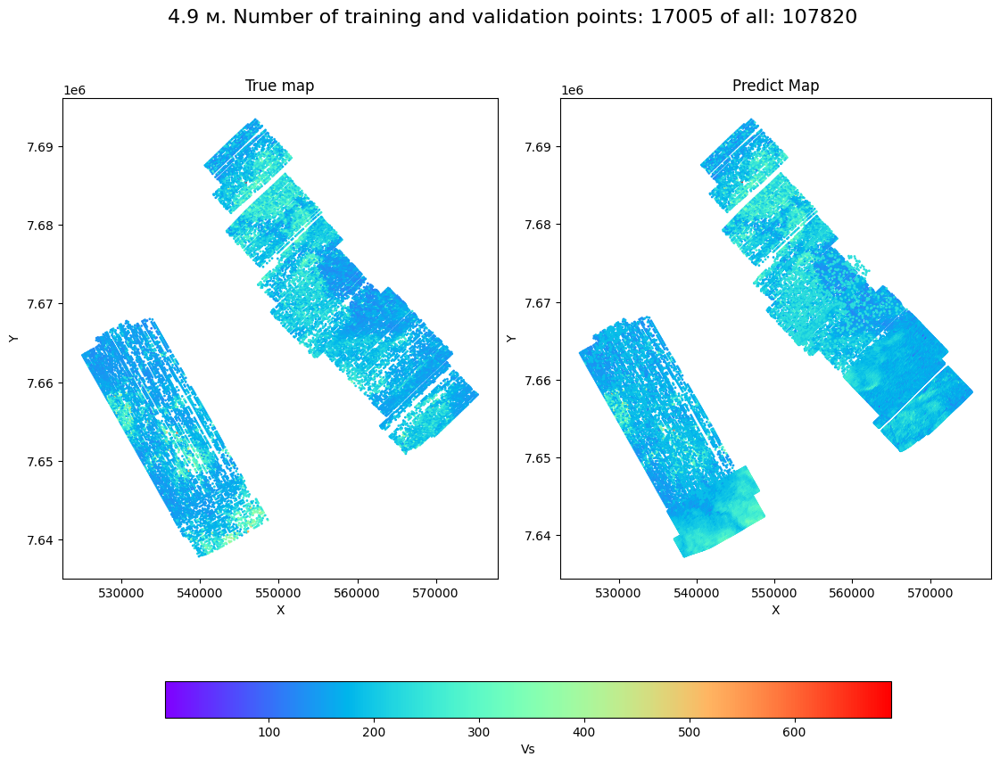

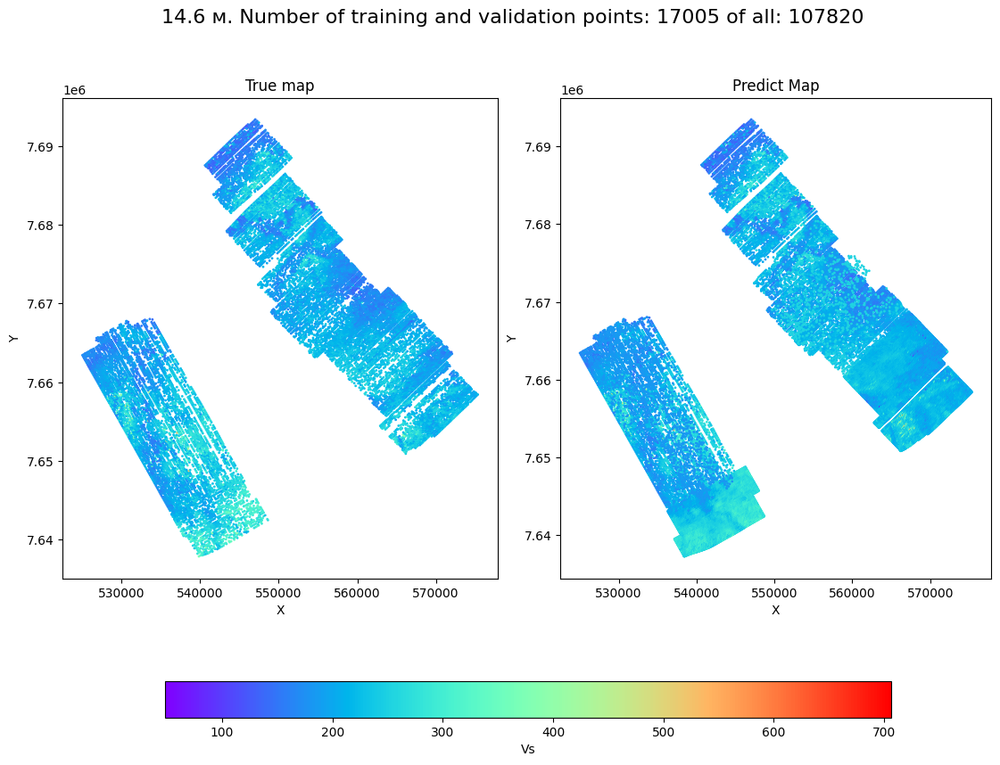

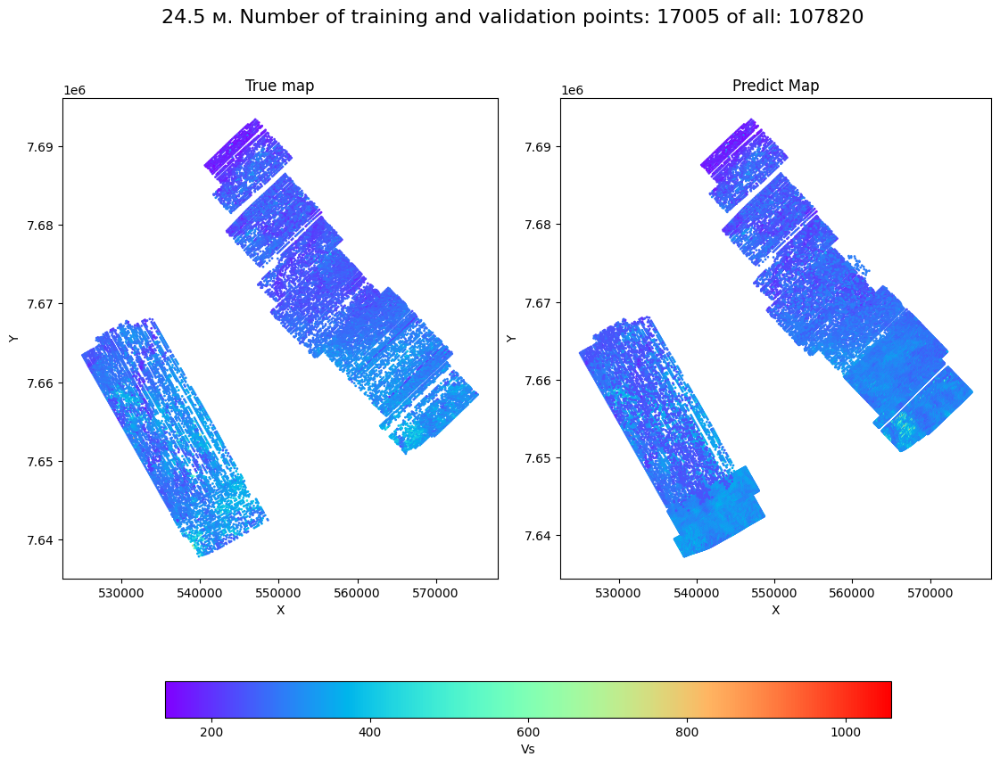

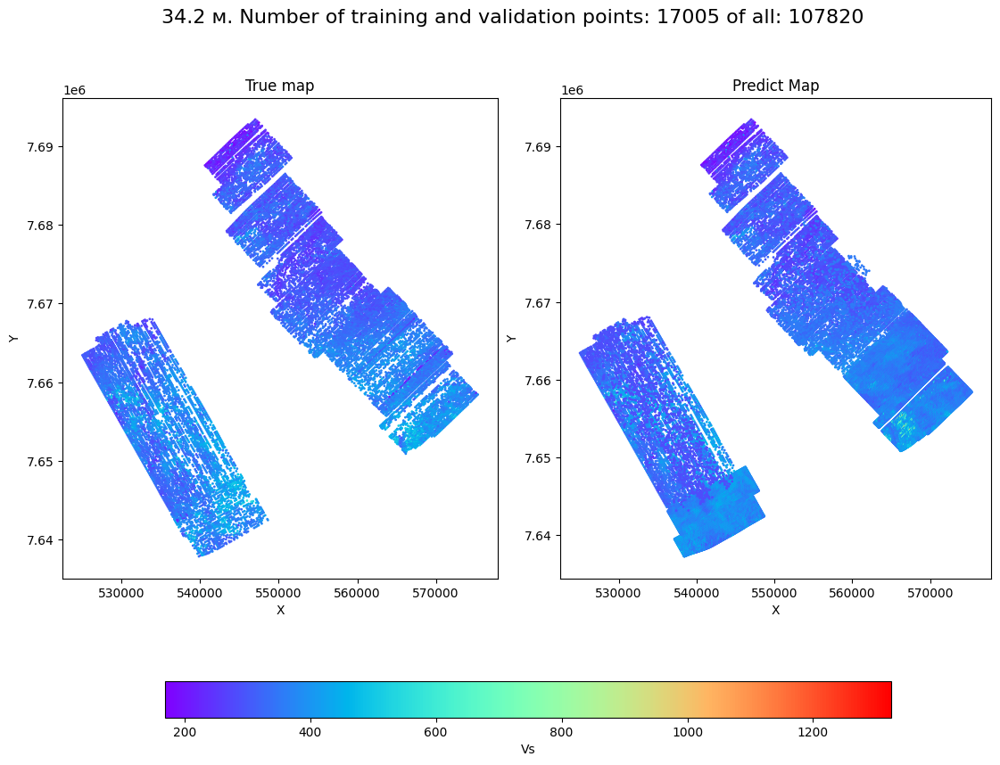

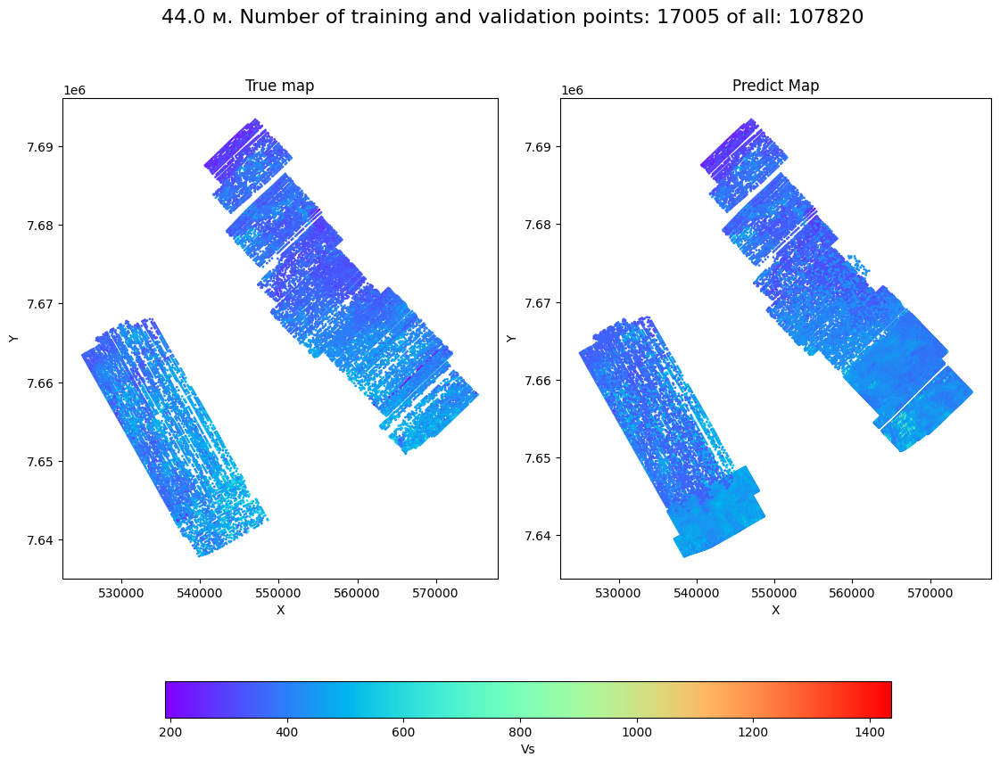

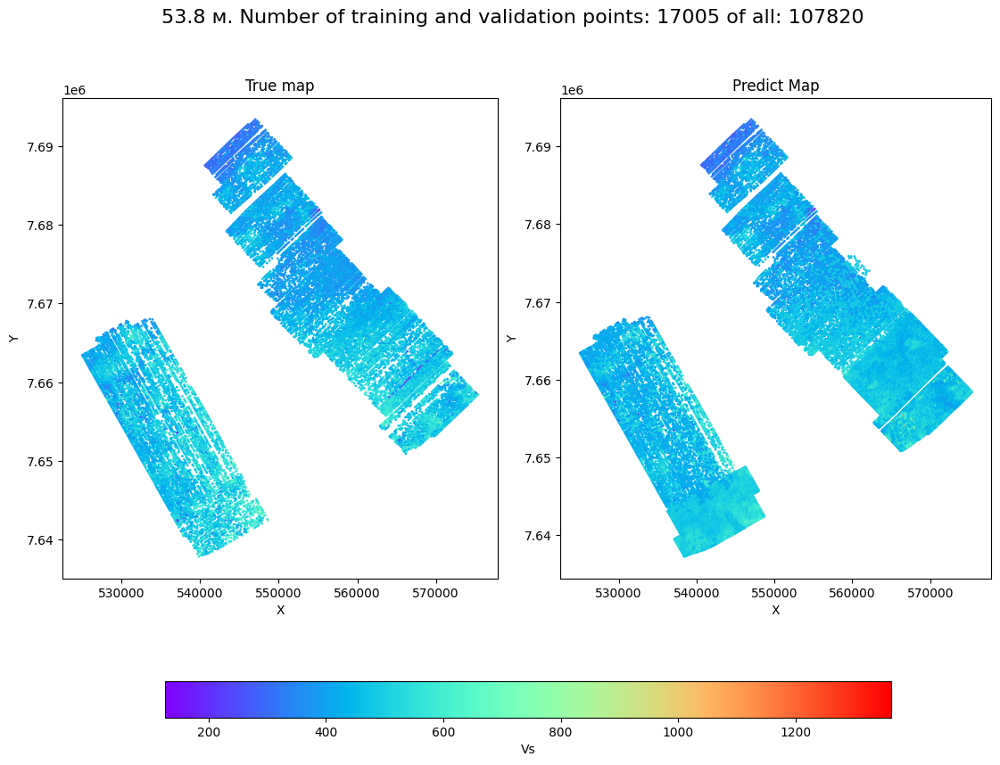

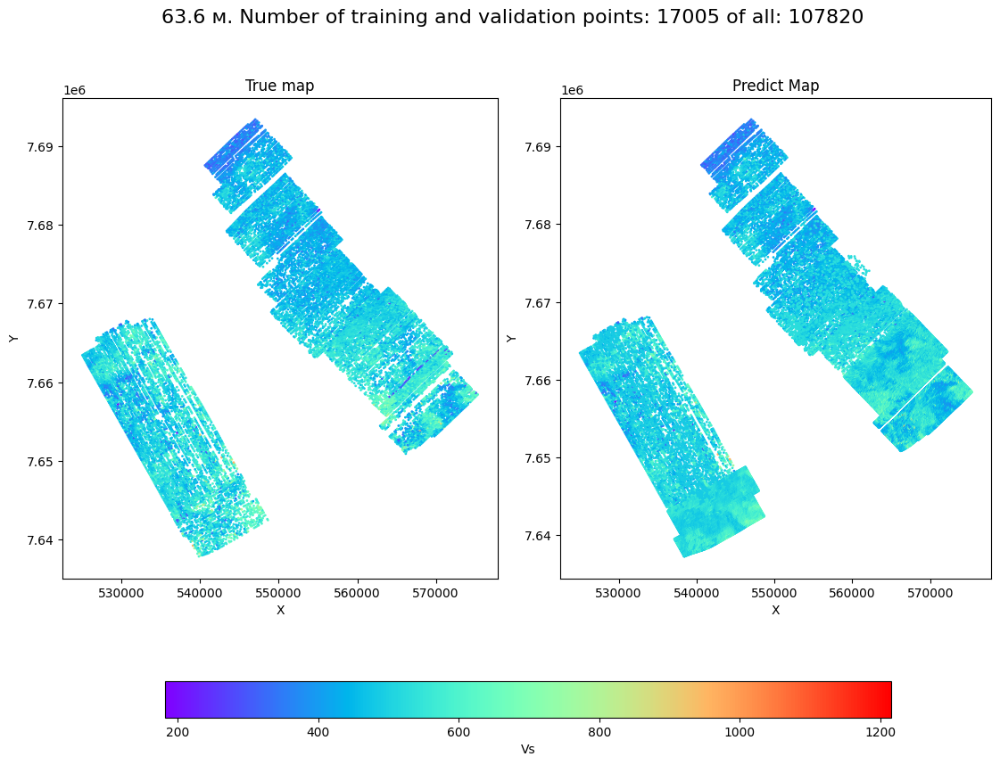

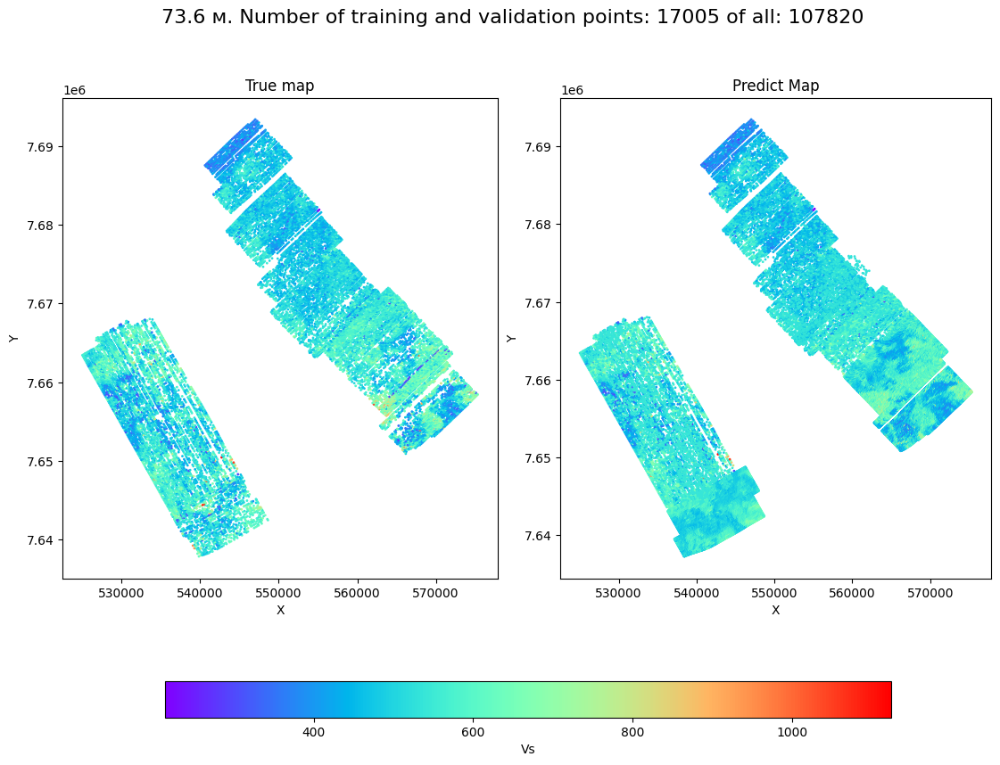

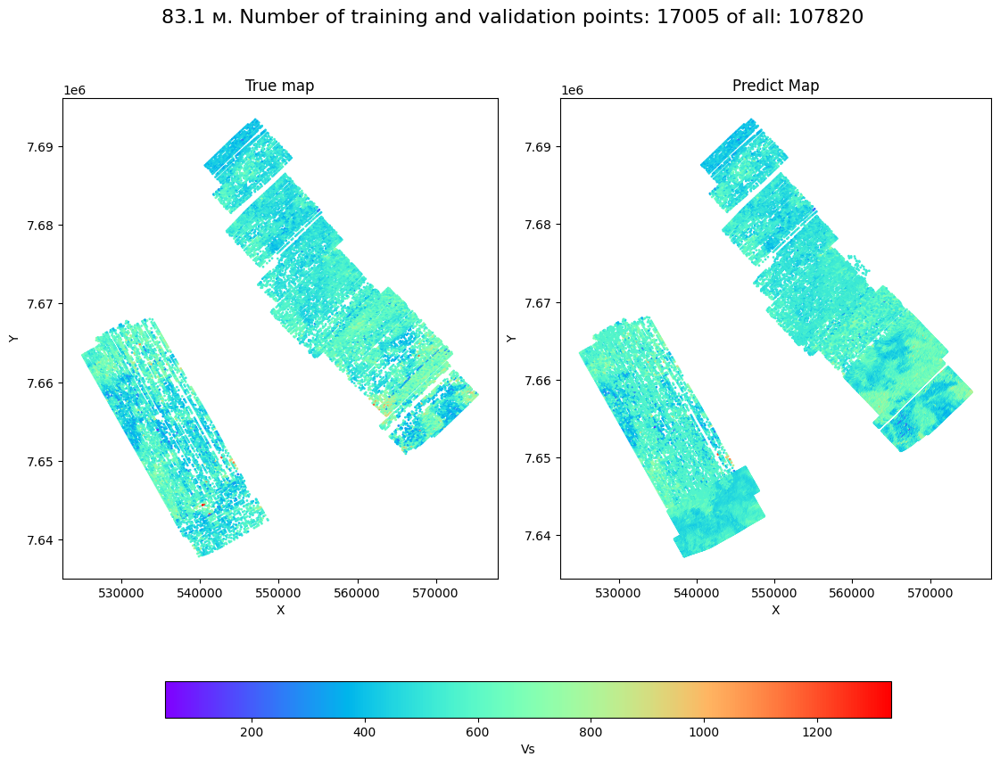

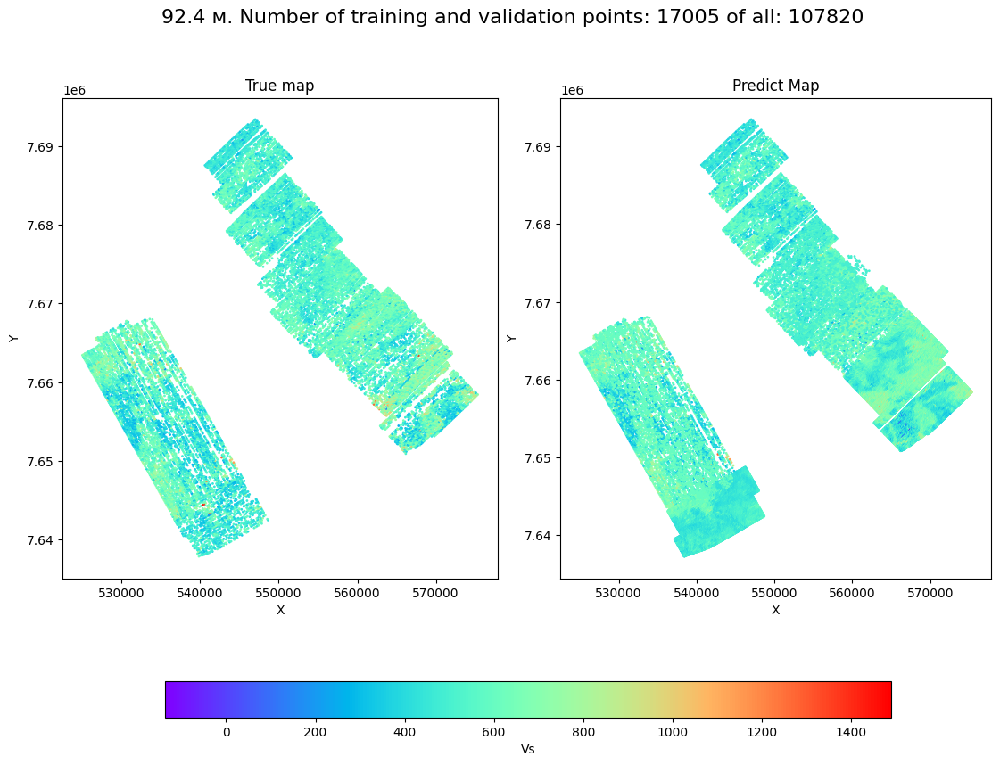

In [121]:
depth_ar = [4.9, 14.6, 24.5, 34.2, 44.0, 53.8, 63.6, 73.6, 83.1, 92.4]
y_pred = np.squeeze(np.array(list(seysm_dict.values())), axis=1)
coord_test = np.array(list(seysm_dict.keys()))
y_train = np.array(y_train)
for i in range(10):
    true_slice = np.column_stack((coord_train, y_train[:, i]))
    pred_slice = do_array_for_mapping(coord_train, coord_test, y_train[:, i], y_pred[:, i])
    our_map = plot_map(true_slice, pred_slice, depth_ar[i], X_train.shape[0], 0, y_pred.shape[0])
    our_map.savefig(f"../reports/figures/maps/{round(depth_ar[i])}map_second_place.png")
    plt.show(our_map)